In [1]:
import os

In [2]:
try:
    import prince
    print ("Imported module: prince\n")
except ImportError:
    print ("Trying to Install required module: prince\n")
    os.system('python -m pip install prince')

Imported module: prince



In [3]:
try:
    import shap
    print ("Imported module: shap\n")
except ImportError:
    print ("Trying to Install required module: shap\n")
    os.system('python -m pip install shap')

Imported module: shap



In [4]:
try:
    import lightgbm
    print ("Imported module: lightgbm\n")
except ImportError:
    print ("Trying to Install required module: lightgbm\n")
    os.system('python -m pip install lightgbm')

You are using pyarrow version 11.0.0 which is known to be insecure. See https://www.cve.org/CVERecord?id=CVE-2023-47248 for further details. Please upgrade to pyarrow>=14.0.1 or install pyarrow-hotfix to patch your current version.


Imported module: lightgbm



In [5]:
import pandas as pd
import numpy as np
import datetime
import re
# import modules
import matplotlib.pyplot as mp
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import pandas as pd
import seaborn as sb
from scipy import stats
#from sklearn.linear_model import LinearRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
import warnings
warnings.filterwarnings('ignore')
#from sklearn.model_selection import train_test_split
#from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, mean_squared_error
from datetime import datetime
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform
import numpy as np
from math import isnan
from prince import FAMD
import time
import seaborn as sns
import shap 
import lightgbm
import math
import numpy as np 
import pandas as pd
from sklearn.cluster import KMeans
from kneed import KneeLocator
import sklearn.metrics as sklearn_metrics
import matplotlib.pyplot as plt
from collections import defaultdict
from sklearn.cluster import KMeans
from kneed import KneeLocator
import sklearn.metrics as sklearn_metrics
import matplotlib.pyplot as plt
from collections import defaultdict
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import OneHotEncoder
from sklearn.decomposition import PCA
import clusteval

In [26]:
path =r"Final_PreProcessed_Acc_Data.csv"
usaccidents = pd.read_csv(path)

In [27]:
usaccidents=usaccidents.drop_duplicates(ignore_index=False)
usaccidents.shape #127659

(127659, 27)

In [28]:
usaccidents.columns

Index(['Start_Time', 'Severity', 'Start_Lng', 'Start_Lat', 'End_Lng',
       'End_Lat', 'Distance(mi)', 'State', 'County', 'Zipcode',
       'Temperature(F)', 'Wind_Speed(mph)', 'Pressure(in)', 'Humidity(%)',
       'Wind_Direction', 'Junction', 'No_Exit', 'Railway', 'Roundabout',
       'Station', 'Stop', 'Give_Way', 'Crossing', 'Traffic_Calming',
       'Traffic_Signal', 'Turning_Loop', 'Sunrise_Sunset'],
      dtype='object')

In [29]:
#usaccidents=usaccidents[(usaccidents['State']=='CA') & (usaccidents['Start_Time'] >= '2022-10-01') ]
#usaccidents=usaccidents.drop_duplicates(ignore_index=False)
#usaccidents.shape # 143943

In [30]:
print(usaccidents.duplicated().sum())
print(usaccidents.shape)

0
(127659, 27)


#### Based on the resource below, updating the values of Wind Direction to the actual standard values
#### http://snowfence.umn.edu/Components/winddirectionanddegrees.htm

In [31]:
usaccidents["Wind_Direction"] = np.where(usaccidents["Wind_Direction"] == "Variable", 'VAR', usaccidents["Wind_Direction"] )
usaccidents["Wind_Direction"] = np.where(usaccidents["Wind_Direction"] == "Calm", 'CALM', usaccidents["Wind_Direction"] )
usaccidents["Wind_Direction"] = np.where(usaccidents["Wind_Direction"] == "West", 'W', usaccidents["Wind_Direction"] )
usaccidents["Wind_Direction"] = np.where(usaccidents["Wind_Direction"] == "South", 'S', usaccidents["Wind_Direction"] )
usaccidents["Wind_Direction"] = np.where(usaccidents["Wind_Direction"] == "North", 'N', usaccidents["Wind_Direction"] )
usaccidents["Wind_Direction"] = np.where(usaccidents["Wind_Direction"] == "East", 'E', usaccidents["Wind_Direction"] )
print(usaccidents.duplicated().sum())
print(usaccidents.shape)

0
(127659, 27)


#### We would need to impute both Categorical and Numerical features.
#### For Categorical, we will deploy the mode method, since there is no concept of Averages while looking at Categorical data. Also Mode would make more sense than Median
#### As for Numerical features, we will deploy interpolation to perform imputation.
#### And for those Numerical features that are Outliers, since the record count is small, we will remove those records.

In [32]:
usaccidents.isna().sum()

Start_Time             0
Severity               0
Start_Lng              0
Start_Lat              0
End_Lng            25514
End_Lat            25514
Distance(mi)           0
State                  0
County                 0
Zipcode                0
Temperature(F)       966
Wind_Speed(mph)     1313
Pressure(in)         271
Humidity(%)         1172
Wind_Direction      1313
Junction               0
No_Exit                0
Railway                0
Roundabout             0
Station                0
Stop                   0
Give_Way               0
Crossing               0
Traffic_Calming        0
Traffic_Signal         0
Turning_Loop           0
Sunrise_Sunset       350
dtype: int64

In [33]:
usaccidents['Humidity(%)']=usaccidents['Humidity(%)'].interpolate(method='polynomial',order=1)
usaccidents['Wind_Speed(mph)']=usaccidents['Wind_Speed(mph)'].interpolate(method='polynomial',order=1)
usaccidents['Pressure(in)']=usaccidents['Pressure(in)'].interpolate(method='polynomial',order=1)
usaccidents['Temperature(F)']=usaccidents['Temperature(F)'].interpolate(method='polynomial',order=1)
embarked_mode = usaccidents['Wind_Direction'].mode()[0]
usaccidents['Wind_Direction'].fillna(embarked_mode, inplace=True)
embarked_mode = usaccidents['Sunrise_Sunset'].mode()[0]
usaccidents['Sunrise_Sunset'].fillna(embarked_mode, inplace=True)

In [34]:
#usaccidents.info()

In [39]:
# Distance Outlier Removal
Q1 = usaccidents['Distance(mi)'].quantile(0.25)
Q3 = usaccidents['Distance(mi)'].quantile(0.75)
IQR = Q3 - Q1
df_temp_outliers = usaccidents[((usaccidents['Distance(mi)'] < (Q1 - 3 * IQR)) |(usaccidents['Distance(mi)'] > (Q1 + 3 * IQR)))]
out_index_temp = df_temp_outliers['Distance(mi)'].index.tolist()
usaccidents.drop(out_index_temp , inplace=True)

print(len(out_index_temp))
print(usaccidents.shape)



11546
(116113, 27)


In [40]:
print(usaccidents.duplicated().sum())
print(usaccidents.shape) # 116113

0
(116113, 27)


In [41]:
# Interpolation for Numerical
usaccidents['Humidity(%)']=usaccidents['Humidity(%)'].interpolate(method='polynomial',order=1)
usaccidents['Wind_Speed(mph)']=usaccidents['Wind_Speed(mph)'].interpolate(method='polynomial',order=1)
usaccidents['Pressure(in)']=usaccidents['Pressure(in)'].interpolate(method='polynomial',order=1)
usaccidents['Temperature(F)']=usaccidents['Temperature(F)'].interpolate(method='polynomial',order=1)
#usaccidents.dropna(subset='Wind_Speed(mph)',inplace=True) # We had to remove 3 records since Interpolation couldn't impute them for some reason

In [42]:
usaccidents.duplicated().sum()

0

In [43]:
#usaccidents.drop_duplicates(inplace=True)
usaccidents.shape
# 116113

(116113, 27)

### After all of the imputation and outlier removals, we are left with ~116K records 

#### Now we can create additional time dimension data which could possibly help in determining better clusters

In [44]:
usaccidents['Start_Time']=pd.to_datetime(usaccidents['Start_Time'])
usaccidents['Weekday'] = usaccidents['Start_Time'].dt.weekday
usaccidents['Year'] = usaccidents['Start_Time'].dt.year#.astype(int)
usaccidents['Month'] = usaccidents['Start_Time'].dt.month#.astype(int)
usaccidents['Hour'] = usaccidents['Start_Time'].dt.hour#.astype(int)
usaccidents.drop('Start_Time', axis=1, inplace=True) 


In [45]:
usaccidents['State'].value_counts()

State
CA    61283
FL    37931
TX    16899
Name: count, dtype: int64

In [46]:
usaccidents.to_csv(r"Final_PreProcessed_Acc_Data_LATEST.csv")
#usaccidents = pd.read_csv("Final_PreProcessed_Acc_Data_LATEST_500K.csv")
#usaccidents.info()
#usaccidents.duplicated().sum() # Add details, There are 571 dups, but these are seperate accidents. 

#### Additionally, we can perform Hopkins Analysis on the data to validate if there are clusters available. This can only be done on the Numerical features, but it should yield a useful response on the viability of valid clusters

In [48]:
# https://sushildeore99.medium.com/really-what-is-hopkins-statistic-bad1265df4b

def hopkins(X):
    d = X.shape[1]
    #d = len(vars) # columns
    n = len(X) # rows
    m = int(0.1 * n) # heuristic from article [1]
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    H = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(H):
        print(ujd, wjd)
        H = 0
 
    return H

In [49]:
usaccidents_1=usaccidents

# categorical_columns = ['Severity','Start_Lng','Start_Lat','End_Lat','End_Lng','Sunrise_Sunset',
#  'Stop',
#  'Amenity',
#  'Traffic_Signal',
#  'Bump',
#  'Crossing',
#  'Give_Way',
#  'Roundabout',
#  'Wind_Direction',
#  'Weather_Condition',
#  'Severity',
#  'Weekday',
#  'Year',
#  'Month',
#  'Hour']



Num_features =usaccidents_1.select_dtypes(include=[np.number]).columns
# #usaccidents_final=usaccidents.sample(n=50000)
hopkins(usaccidents_1[[
       'Distance(mi)', 'Temperature(F)', 'Wind_Speed(mph)',
       'Pressure(in)', 'Humidity(%)', 'Weekday', 'Year', 'Month', 'Hour']])
#Num_features
#Hopkins Score: .946  Closer to 1 means there is clustering capability present

0.9462594773606052

In [52]:
usaccidents.columns

Index(['Severity', 'Start_Lng', 'Start_Lat', 'End_Lng', 'End_Lat',
       'Distance(mi)', 'State', 'County', 'Zipcode', 'Temperature(F)',
       'Wind_Speed(mph)', 'Pressure(in)', 'Humidity(%)', 'Wind_Direction',
       'Junction', 'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
       'Give_Way', 'Crossing', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Weekday', 'Year', 'Month', 'Hour'],
      dtype='object')

In [53]:
usaccidents.shape #116113
#usaccidents.groupby(['Year','Month', 'State']).size()

(116113, 30)

#### Next, we consider just the Numerical and Categorical variables that are needed to be fed to the model

In [54]:
usaccidents_main=usaccidents[[
 'Temperature(F)',
 'Wind_Speed(mph)',
 'Pressure(in)',
 'Humidity(%)',
 'Distance(mi)',
 'Sunrise_Sunset',
 'Stop',
 
 'Traffic_Signal',


 'Give_Way',

 'Wind_Direction',
 'Junction',
    'Crossing',


 'Weekday',
 'Year',
 'Month',
 'Hour']]

In [56]:
usaccidents_main.shape #116113

(116113, 16)

In [57]:
usaccidents_main.info()

<class 'pandas.core.frame.DataFrame'>
Index: 116113 entries, 0 to 127658
Data columns (total 16 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Temperature(F)   116113 non-null  float64
 1   Wind_Speed(mph)  116113 non-null  float64
 2   Pressure(in)     116113 non-null  float64
 3   Humidity(%)      116113 non-null  float64
 4   Distance(mi)     116113 non-null  float64
 5   Sunrise_Sunset   116113 non-null  object 
 6   Stop             116113 non-null  bool   
 7   Traffic_Signal   116113 non-null  bool   
 8   Give_Way         116113 non-null  bool   
 9   Wind_Direction   116113 non-null  object 
 10  Junction         116113 non-null  bool   
 11  Crossing         116113 non-null  bool   
 12  Weekday          116113 non-null  int32  
 13  Year             116113 non-null  int32  
 14  Month            116113 non-null  int32  
 15  Hour             116113 non-null  int32  
dtypes: bool(5), float64(5), int32(4), object(2)

In [58]:
list(set(list(usaccidents.columns)) - set(list(usaccidents_main.columns)))

['Traffic_Calming',
 'Station',
 'Start_Lat',
 'Start_Lng',
 'End_Lat',
 'State',
 'Railway',
 'County',
 'No_Exit',
 'Severity',
 'Roundabout',
 'End_Lng',
 'Turning_Loop',
 'Zipcode']

### At this stage, we will need to use the KMeans Model to perform clustering. 
#### KMeans only works with Numerical data; hence we would need to perform a coversion of the Categorical Variables into Numerical. One-Hot Encoding is an effective way, but then, the feature size would also increase. 
#### FAMD is an innovation which will take care of both the Categorical feature conversion as well as dimensionality reduction. The project report has details of papers which explain this.

In [59]:
usaccidents_main[usaccidents_main.columns[5:16]]

,Sunrise_Sunset,Stop,Traffic_Signal,Give_Way,Wind_Direction,Junction,Crossing,Weekday,Year,Month,Hour
0,Day,False,True,False,W,False,False,5,2022,8,13
1,Night,False,False,False,CALM,False,False,4,2020,12,1
2,Day,False,False,False,SW,False,False,4,2021,8,16
3,Day,False,False,False,VAR,False,False,2,2022,10,13
5,Day,False,False,False,WSW,False,False,0,2020,11,12
...,...,...,...,...,...,...,...,...,...,...,...
127654,Day,False,False,False,NE,False,False,2,2021,4,16
127655,Night,False,False,False,CALM,False,False,6,2020,11,0
127656,Night,False,False,False,NE,False,False,3,2020,10,2
127657,Day,False,False,False,SW,False,False,2,2022,2,12


In [60]:
###### Assign Object Category to Cat Vars in order to feed to the FAMD Model
usaccidents_main[usaccidents_main.columns[5:16]]=usaccidents_main[usaccidents_main.columns[5:16]].astype(object)


In [61]:
usaccidents_final = usaccidents_main
# usaccidents_main.nunique()
usaccidents_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 116113 entries, 0 to 127658
Data columns (total 16 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Temperature(F)   116113 non-null  float64
 1   Wind_Speed(mph)  116113 non-null  float64
 2   Pressure(in)     116113 non-null  float64
 3   Humidity(%)      116113 non-null  float64
 4   Distance(mi)     116113 non-null  float64
 5   Sunrise_Sunset   116113 non-null  object 
 6   Stop             116113 non-null  object 
 7   Traffic_Signal   116113 non-null  object 
 8   Give_Way         116113 non-null  object 
 9   Wind_Direction   116113 non-null  object 
 10  Junction         116113 non-null  object 
 11  Crossing         116113 non-null  object 
 12  Weekday          116113 non-null  object 
 13  Year             116113 non-null  object 
 14  Month            116113 non-null  object 
 15  Hour             116113 non-null  object 
dtypes: float64(5), object(11)
memory usage: 15.

In [62]:
usaccidents_final.columns
print(usaccidents_final.duplicated().sum())

usaccidents_final=usaccidents_final.drop_duplicates(ignore_index=False)
print(usaccidents_final.shape) #115538

575
(115538, 16)


In [64]:
usaccidents_final.nunique()
#usaccidents_final.drop_duplicates(inplace=True)

Temperature(F)      173
Wind_Speed(mph)      81
Pressure(in)        813
Humidity(%)         189
Distance(mi)       2004
Sunrise_Sunset        2
Stop                  2
Traffic_Signal        2
Give_Way              2
Wind_Direction       18
Junction              2
Crossing              2
Weekday               7
Year                  4
Month                12
Hour                 24
dtype: int64

In [65]:
#usaccidents_final.to_csv(r"US_Acc_Final_One_CA.csv", index=False)
usaccidents_final.shape #87429

(115538, 16)

In [66]:
# From the above, we can see that if we One-Hot Encode the Categorical Variables, the total Variable count will come close to 100!
# 
# Checking various values of the parameter n_components, we settled on 65 which gave a satisfactory value for 
# % of explained intertia (explained variance)
famd = FAMD(n_components=65, 
            n_iter=50,
         copy=True,
    check_input=True,
    random_state=42,
    engine="sklearn",
    handle_unknown="error"  # same parameter as sklearn.preprocessing.OneHotEncoder
           )


In [67]:
famd.fit(usaccidents_final)


FAMD(n_components=65, n_iter=50, random_state=42)

In [68]:
famd.eigenvalues_summary#['% of variance']

,eigenvalue,% of variance,% of variance (cumulative)
component,,,
0,12.116,3.29%,3.29%
1,8.379,2.28%,5.57%
2,7.865,2.14%,7.71%
3,7.165,1.95%,9.65%
4,6.750,1.83%,11.49%
...,...,...,...
60,4.566,1.24%,95.05%
61,4.332,1.18%,96.23%
62,3.641,0.99%,97.22%


In [69]:
famdX = famd.transform(usaccidents_final)
famdX.shape #115538 at 64 components, represents 98.9 % of the variance

(115538, 65)

In [48]:
#famdX.shape

In [70]:
#famdX.to_csv(r"Post_FAMD_CA_oneyear.csv")
path =r"Post_FAMD_CA_oneyear.csv"
#famdX = pd.read_csv(path)

In [71]:
def inertia_score(X, labels):
    
 

    inertia = 0
    for label in set(labels):
        X_cluster = X.loc[labels == label, :]
        centroid = np.mean(X_cluster, axis=0)
        inertia += np.sum((X_cluster - centroid) ** 2)
    return inertia.sum()


def calinski_harabasz_score(X, labels):
 
      if len(set(labels)) == 1:
        return float("NaN")
      else:
        return sklearn_metrics.calinski_harabasz_score(X, labels)


def davies_bouldin_score(X, labels):
      if len(set(labels)) == 1:
        return float("NaN")
      else:
        return sklearn_metrics.davies_bouldin_score(X, labels)

def silhouette_score_1(X, labels):
    
    if len(set(labels)) == 1:
        return float("NaN")
    else:
        return sklearn_metrics.silhouette_score(X, labels)
    


In [112]:
from lightgbm import LGBMClassifier
import shap
from sklearn.model_selection import cross_val_score
lgbm_data = usaccidents_final.copy()

def CV_F1_Score( labels):
    for c in lgbm_data.select_dtypes(include='object'):
        lgbm_data[c] = lgbm_data[c].astype('category')

    #KMeans clusters
    clf_km = LGBMClassifier(colsample_bytree=0.8)
    cv_scores_km = cross_val_score(clf_km, lgbm_data, labels, scoring='f1_weighted')
    return np.mean(cv_scores_km)




In [113]:
# Choose optimal K using Elbow method
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split

n_clusters = range(2,21)
wcss = []
db_score=[]
ch_score=[]
i_score=[]
s_score=[]
lgbm_score=[]
run_time = []
clusters_assigned = {}

for cluster in n_clusters:
    try:
        start = time.time()
        kmeans  = KMeans(n_clusters=cluster,  init='k-means++')
        clusters = kmeans.fit_predict(famdX)
        run_time.append((time.time() - start) )
        
        
        
        wcss.append(kmeans.inertia_)
        db_score.append(davies_bouldin_score(famdX,kmeans.labels_))
        ch_score.append(calinski_harabasz_score(famdX,kmeans.labels_ ))
        i_score.append(inertia_score(famdX,kmeans.labels_ ))
        s_score.append(silhouette_score_1(famdX,kmeans.labels_))
        lgbm_score.append(CV_F1_Score(kmeans.labels_))
              
        
        clusters_assigned[cluster] = clusters
        print('Cluster initiation: {}'.format(cluster))
        print('Time take for iteration {0} is {1} seconds'.format(str(cluster),str(round(run_time[cluster-2],2))))
    except Exception as e:
        print(e)


[LightGBM] [Info] Number of positive: 32115, number of negative: 60315
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003248 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 914
[LightGBM] [Info] Number of data points in the train set: 92430, number of used features: 17
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.347452 -> initscore=-0.630258
[LightGBM] [Info] Start training from score -0.630258
[LightGBM] [Info] Number of positive: 32115, number of negative: 60315
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003038 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 917
[LightGBM] [Info] Number of data points in the train set: 92430, number of used features: 17
[LightGBM] [Info] [b

Cluster initiation: 4
Time take for iteration 4 is 0.27 seconds
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002926 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 914
[LightGBM] [Info] Number of data points in the train set: 92430, number of used features: 17
[LightGBM] [Info] Start training from score -0.575900
[LightGBM] [Info] Start training from score -3.648486
[LightGBM] [Info] Start training from score -2.175839
[LightGBM] [Info] Start training from score -1.599427
[LightGBM] [Info] Start training from score -2.340850
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003157 seconds.
You can set `force_row_wise=true` to remove the overhead.
An

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 917
[LightGBM] [Info] Number of data points in the train set: 92430, number of used features: 17
[LightGBM] [Info] Start training from score -3.949277
[LightGBM] [Info] Start training from score -1.416186
[LightGBM] [Info] Start training from score -2.420125
[LightGBM] [Info] Start training from score -2.349883
[LightGBM] [Info] Start training from score -1.540366
[LightGBM] [Info] Start training from score -1.388395
[LightGBM] [Info] Start training from score -2.407669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you 

Cluster initiation: 8
Time take for iteration 8 is 0.32 seconds
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002754 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 914
[LightGBM] [Info] Number of data points in the train set: 92430, number of used features: 17
[LightGBM] [Info] Start training from score -2.822067
[LightGBM] [Info] Start training from score -3.056736
[LightGBM] [Info] Start training from score -2.623598
[LightGBM] [Info] Start training from score -3.249693
[LightGBM] [Info] Start training from score -2.802614
[LightGBM] [Info] Start training from score -2.544761
[LightGBM] [Info] Start training from score -3.461396
[LightGBM] [Info] Start training from score -1.318718
[LightGBM] [Info] Start training from score -1.066702
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003034 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 913
[LightGBM] [Info] Number of data points in the train set: 92431, number of used features: 17
[LightGBM] [Info] Start training from score -2.645015
[LightGBM] [Info] Start training from score -1.058635
[LightGBM] [Info] Start training from score -3.249704
[LightGBM] [Info] Start training from score -2.736371
[LightGBM] [Info] Start training from score -2.724093
[LightGBM] [Info] Start training from score -2.253512
[LightGBM] [Info] Start training from score -2.535715
[LightGBM] [Info] Start training from score -2.287350
[LightGBM] [Info] Start training from score -3.251100
[LightGBM] [Info] Start training from score -2.426238
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

Cluster initiation: 11
Time take for iteration 11 is 0.36 seconds
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002578 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 914
[LightGBM] [Info] Number of data points in the train set: 92430, number of used features: 17
[LightGBM] [Info] Start training from score -3.435871
[LightGBM] [Info] Start training from score -3.251368
[LightGBM] [Info] Start training from score -1.644336
[LightGBM] [Info] Start training from score -2.779341
[LightGBM] [Info] Start training from score -2.714726
[LightGBM] [Info] Start training from score -3.282874
[LightGBM] [Info] Start training from score -1.938988
[LightGBM] [Info] Start training from score -3.886178
[LightGBM] [Info] Start training from score -3.328296
[LightGBM] [Info] Start training from score -3.132933
[LightGBM] [Info] Start training from scor

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 917
[LightGBM] [Info] Number of data points in the train set: 92430, number of used features: 17
[LightGBM] [Info] Start training from score -2.697718
[LightGBM] [Info] Start training from score -2.802793
[LightGBM] [Info] Start training from score -0.813319
[LightGBM] [Info] Start training from score -3.267707
[LightGBM] [Info] Start training from score -3.738904
[LightGBM] [Info] Start training from score -3.249693
[LightGBM] [Info] Start training from score -3.244130
[LightGBM] [Info] Start training from score -2.692112
[LightGBM] [Info] Start training from score -2.822067
[LightGBM] [Info] Start training from score -2.960130
[LightGBM] [Info] Start training 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002947 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-ch

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002533 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 912
[LightGBM] [Info] Number of data points in the train set: 92431, number of used features: 17
[LightGBM] [Info] Start training from score -3.461407
[LightGBM] [Info] Start training from score -2.802803
[LightGBM] [Info] Start training from score -2.908461
[LightGBM] [Info] Start training from score -2.607043
[LightGBM] [Info] Start training from score -3.489726
[LightGBM] [Info] Start training from score -4.160431
[LightGBM] [Info] Start training from score -3.210859
[LightGBM] [Info] Start training from score -2.782494
[LightGBM] [Info] Start training from score -3.531730
[LightGBM] [Info] Start training from score -3.886189
[LightGBM] [Info] Start training from score -2.899578
[LightGBM] [Info] Start training from score -3.949287


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002789 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 913
[LightGBM] [Info] Number of data points in the train set: 92431, number of used features: 17
[LightGBM] [Info] Start training from score -3.279143
[LightGBM] [Info] Start training from score -3.064365
[LightGBM] [Info] Start training from score -3.236679
[LightGBM] [Info] Start training from score -3.292445
[LightGBM] [Info] Start training from score -3.206842
[LightGBM] [Info] Start training from score -3.205507
[LightGBM] [Info] Start training from score -2.962859
[LightGBM] [Info] Start training from score -2.860077
[LightGBM] [Info] Start training from score -3.886189
[LightGBM] [Info] Start training from score -2.630343
[LightGBM] [Info] Start training from score -3.663151
[LightGBM] [Info] Start training from score -3.268286


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [114]:
list(range(2,15))

[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]

In [116]:
df_meta = pd.DataFrame({'WCSS':wcss, "Run_Time": run_time, "DB Score": db_score, "CH Score": ch_score,\
                       'Inertia Score': i_score, 'Silhouette Score': s_score, "LGBM CV F1": lgbm_score})
df_meta["cluster"]  = list(range(2,21))
df_meta.sort_values(by=['Silhouette Score','CH Score','DB Score'], ascending=[False, False, True])

,WCSS,Run_Time,DB Score,CH Score,Inertia Score,Silhouette Score,LGBM CV F1,cluster
18,3.097673e+07,0.325561,2.866450,2173.892368,3.097673e+07,0.109236,0.999861,20
16,3.197257e+07,0.360889,3.166157,2142.358543,3.197257e+07,0.104561,0.999905,18
15,3.254720e+07,0.338601,2.908352,2108.612890,3.254720e+07,0.085448,0.999256,17
17,3.217383e+07,0.426595,2.997367,1970.519304,3.217383e+07,0.082475,0.998866,19
13,3.326777e+07,0.300567,2.932675,2178.960717,3.326777e+07,0.075317,0.998685,15
11,3.437706e+07,0.266544,2.956592,2149.484224,3.437706e+07,0.074572,0.999991,13
14,3.317914e+07,0.328087,2.868578,2059.683838,3.317914e+07,0.073107,0.999922,16
12,3.433100e+07,0.294276,3.032549,1998.707289,3.433100e+07,0.061255,0.999524,14
10,3.504593e+07,0.257033,3.232736,2099.714841,3.504593e+07,0.060769,0.999784,12
9,3.574643e+07,0.356091,3.459593,2038.058157,3.574642e+07,0.057230,0.999325,11


In [ ]:
#df_meta["cluster"]  = list(range(2,15))
#df_meta

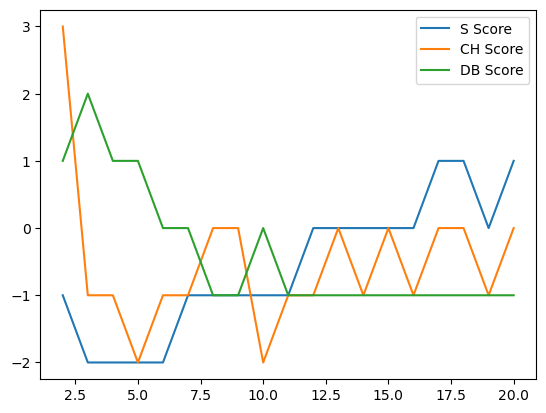

In [117]:
#ax = df_meta.plot(x="cluster", y="Inertia Score", ylabel='Inertia Score', legend=False)
#ax2 = ax.twinx()
#df_meta.plot(x="cluster", y="Run_Time", ax=ax2, ylabel='Run Time in seconds', legend=False, color="r")
#ax.figure.legend()
#plt.show()


plt.plot(df_meta['cluster'], (df_meta['Silhouette Score']-df_meta['Silhouette Score'].mean()) //
                              df_meta['Silhouette Score'].std() , label = "S Score") 
plt.plot(df_meta['cluster'], (df_meta['CH Score']-df_meta['CH Score'].mean()) //
                              df_meta['CH Score'].std(), label = "CH Score")
plt.plot(df_meta['cluster'], (df_meta['DB Score']-df_meta['DB Score'].mean()) //
                              df_meta['DB Score'].std(), label = "DB Score") 
#plt.plot(x, np.cos(x), label = "curve 2") 

plt.legend() 
plt.show()



In [76]:
def davies_bouldin_score(X, labels):
      if len(set(labels)) == 1:
        return float("NaN")
      else:
        return sklearn_metrics.davies_bouldin_score(X, labels)

def silhouette(estimator, X, y_true=None):
    
    labels = estimator.fit(X).labels_
    if len(set(labels)) == 1:
        return float("NaN")
    else:
        return sklearn_metrics.silhouette_score(X, labels)


In [77]:
#!pip install custom_scorer_module

In [78]:
from sklearn.metrics import make_scorer
from sklearn.metrics import silhouette_score


myscorer = make_scorer(silhouette, greater_is_better=True) 

    
np.random.seed(123)

km_random = KMeans()
km_random_params = {'n_clusters':list(range(2,21)),
             'algorithm':['lloyd','elkan'],
             'init':['k-means++', 'random'],
              'random_state':[123]
            
            }
rand_search = RandomizedSearchCV(km_random,km_random_params, # positional arguments, model and parameter grid
                                     n_iter=50,
                                     scoring=silhouette,
                                     cv=10,
                                     random_state=123,
                                      error_score='raise')

In [79]:
rand_search.fit(famdX)
rand_search.cv_results_.keys()

dict_keys(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time', 'param_random_state', 'param_n_clusters', 'param_init', 'param_algorithm', 'params', 'split0_test_score', 'split1_test_score', 'split2_test_score', 'split3_test_score', 'split4_test_score', 'split5_test_score', 'split6_test_score', 'split7_test_score', 'split8_test_score', 'split9_test_score', 'mean_test_score', 'std_test_score', 'rank_test_score'])

In [120]:
rand_search.best_estimator_

KMeans(n_clusters=20, random_state=123)



# Adjust details based on results from above

In [118]:
kmeans_final = KMeans(init='k-means++', n_clusters=17, random_state=123)
kmeans_final.fit(famdX)
kmeans_labels = kmeans_final.labels_
kmeans_labels.shape #123570

(115538,)

In [119]:
print(davies_bouldin_score(famdX,kmeans_labels ))
print(calinski_harabasz_score(famdX,kmeans_labels))
print(silhouette_score_1(famdX,kmeans_labels))

2.912105861754009
2130.927171001891
0.09307072340201036


In [140]:
#db1.labels_.value_counts()
unique, counts = np.unique(kmeans_labels, return_counts=True)

result = np.column_stack((unique, counts)) 
pd.DataFrame(result).drop(columns=0).iloc[:,0].values

array([ 4330,  4100,  3947, 37894,  5414,  5173,  6487,  4055,  4368,
        6015,  6044,  7257,  5275,  3007,  4437,  3625,  4110],
      dtype=int64)

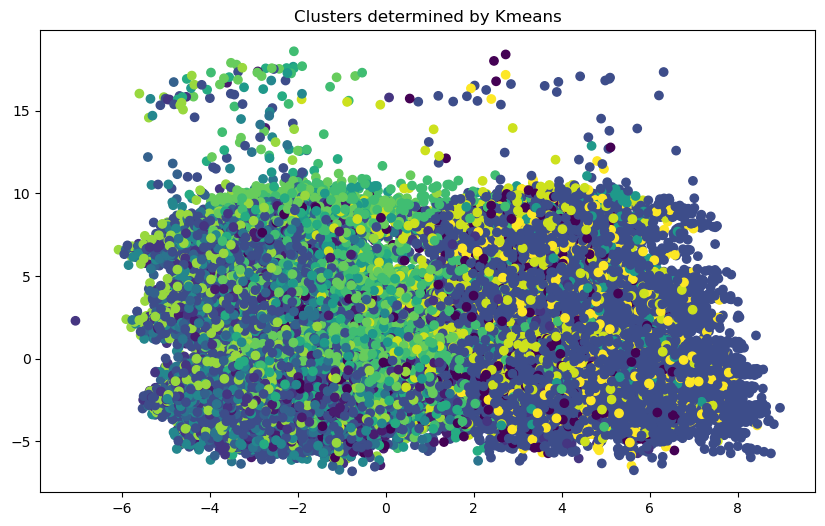

In [85]:
plt.figure(figsize=(10,6))
plt.scatter(famdX.iloc[:,0], famdX.iloc[:,1],c=kmeans_labels)#, cmap='Paired')
plt.title("Clusters determined by Kmeans")
# kmeans.labels_[kmeans.labels_ == -1].size
plt.show()

In [108]:
usaccidents_final.head(2)

,Temperature(F),Wind_Speed(mph),Pressure(in),Humidity(%),Distance(mi),Sunrise_Sunset,Stop,Traffic_Signal,Give_Way,Wind_Direction,Junction,Crossing,Weekday,Year,Month,Hour,cluster
0,68.0,13.0,29.79,73.0,0.022,Day,False,True,False,W,False,False,5,2022,8,13,4
1,42.0,0.0,29.77,34.0,0.046,Night,False,False,False,CALM,False,False,4,2020,12,1,3


#### We can see that with 6 clusters, there are clear Cluster formations (spatially or density based) that are visible.

In [122]:
usaccidents_final["cluster"] = kmeans_labels
usaccidents_final.head(2)

usaccidents_radar=usaccidents_final[['Temperature(F)','Wind_Speed(mph)','Pressure(in)','Humidity(%)','Distance(mi)',\
                                     'Weekday','Year','Month','Hour','cluster']]

usaccidents_radar['Weekday']=usaccidents_radar['Weekday'].astype(int)
usaccidents_radar['Year']=usaccidents_radar['Year'].astype(int)
usaccidents_radar['Month']=usaccidents_radar['Month'].astype(int)
usaccidents_radar['Hour']=usaccidents_radar['Hour'].astype(int)

result = usaccidents_radar.groupby(['cluster']).mean()



result[['Temperature(F)','Wind_Speed(mph)','Pressure(in)','Humidity(%)','Distance(mi)',\
                                     'Weekday','Year','Month','Hour']] \
= result[['Temperature(F)','Wind_Speed(mph)','Pressure(in)','Humidity(%)','Distance(mi)',\
                                     'Weekday','Year','Month','Hour']].\
apply(lambda iterator: ((iterator - iterator.mean())/iterator.std()).round(2))
result

,Temperature(F),Wind_Speed(mph),Pressure(in),Humidity(%),Distance(mi),Weekday,Year,Month,Hour
cluster,,,,,,,,,
0,-0.19,-0.13,-0.76,-0.06,-0.89,1.22,0.15,1.07,1.56
1,0.31,-0.03,0.12,-0.32,-0.17,0.64,0.30,-0.55,-0.46
2,0.71,0.94,-1.93,-0.49,0.73,0.40,0.69,-0.33,0.34
3,-0.18,-0.22,-0.63,-0.05,0.14,0.65,-0.56,0.95,0.37
4,1.28,0.97,0.61,-1.32,1.22,0.19,-0.44,1.22,0.21
5,1.02,0.73,0.35,-1.04,0.94,0.54,0.55,0.82,-0.02
6,1.35,1.12,0.50,-1.42,1.63,0.05,1.00,0.40,0.43
7,-0.76,0.86,1.80,-0.27,-0.53,-0.01,-0.24,0.79,0.12
8,-0.26,-0.51,-0.09,0.28,-0.73,-0.48,0.52,-0.74,-0.69


In [130]:
pd.set_option('expand_frame_repr', False)
from pprint import pp
mean_median_max_df=usaccidents_radar.groupby('cluster').agg({'Temperature(F)': ['mean', 'min', 'max'], 'Month': ['median', 'min', 'max'],\
                                         'Wind_Speed(mph)': ['mean', 'min', 'max'], 'Pressure(in)': ['mean', 'min', 'max'],\
                                         'Humidity(%)': ['mean', 'min', 'max'], 'Distance(mi)': ['median', 'min', 'max'],\
                                         'Weekday': ['median', 'min', 'max'], 'Year': ['median', 'min', 'max'],\
                                         'Hour': ['median', 'min', 'max']})
mdCode = mean_median_max_df.to_html() 
file = open("df_kmeans.html","w")
file.write(mdCode)
file.close()

In [92]:
usaccidents_radar.head(10)

,Temperature(F),Wind_Speed(mph),Pressure(in),Humidity(%),Distance(mi),Weekday,Year,Month,Hour,cluster
0,68.0,13.0,29.79,73.0,0.022,5,2022,8,13,4
1,42.0,0.0,29.77,34.0,0.046,4,2020,12,1,3
2,90.0,12.0,30.03,55.0,0.047,4,2021,8,16,2
3,91.0,7.0,29.34,39.0,0.038,2,2022,10,13,4
5,83.0,14.0,29.89,58.0,0.294,0,2020,11,12,5
6,70.0,3.0,30.09,78.0,0.010,1,2021,11,23,7
7,64.0,5.0,28.92,64.0,0.000,0,2020,6,8,10
8,67.0,10.0,30.28,70.0,0.976,2,2022,2,8,10
9,55.0,6.0,29.68,72.0,1.626,1,2022,3,7,9
10,37.0,0.0,30.23,93.0,0.140,1,2021,1,1,3


In [124]:
import plotly.graph_objects as go
import plotly.offline as pyo

theta=['Temperature(F)','Wind_Speed(mph)','Pressure(in)','Humidity(%)','Distance(mi)',\
                                     'Weekday','Year','Month','Hour']

data=[
        go.Scatterpolar(r=list(result.loc[0].values), theta=theta, fill='toself', name=str(result.index[0])),
        go.Scatterpolar(r=list(result.loc[1].values), theta=theta, fill='toself', name=str(result.index[1])),
    go.Scatterpolar(r=list(result.loc[2].values), theta=theta, fill='toself', name=str(result.index[2])),
    go.Scatterpolar(r=list(result.loc[3].values), theta=theta, fill='toself', name=str(result.index[3])),
    go.Scatterpolar(r=list(result.loc[4].values), theta=theta, fill='toself', name=str(result.index[4])),
    go.Scatterpolar(r=list(result.loc[5].values), theta=theta, fill='toself', name=str(result.index[5])),
    go.Scatterpolar(r=list(result.loc[6].values), theta=theta, fill='toself', name=str(result.index[6])),
    go.Scatterpolar(r=list(result.loc[7].values), theta=theta, fill='toself', name=str(result.index[7])),
    go.Scatterpolar(r=list(result.loc[8].values), theta=theta, fill='toself', name=str(result.index[8])),
    go.Scatterpolar(r=list(result.loc[9].values), theta=theta, fill='toself', name=str(result.index[9])),
    go.Scatterpolar(r=list(result.loc[10].values), theta=theta, fill='toself', name=str(result.index[10])),
    go.Scatterpolar(r=list(result.loc[11].values), theta=theta, fill='toself', name=str(result.index[11])),
    go.Scatterpolar(r=list(result.loc[12].values), theta=theta, fill='toself', name=str(result.index[12])),
    go.Scatterpolar(r=list(result.loc[13].values), theta=theta, fill='toself', name=str(result.index[13])),
     go.Scatterpolar(r=list(result.loc[14].values), theta=theta, fill='toself', name=str(result.index[14])),
     go.Scatterpolar(r=list(result.loc[15].values), theta=theta, fill='toself', name=str(result.index[15])),
     go.Scatterpolar(r=list(result.loc[16].values), theta=theta, fill='toself', name=str(result.index[16]))
    ]


fig = go.Figure(
    data=data,
    layout=go.Layout(
        title=go.layout.Title(text='Kmeans Cluster Radar Plots'),
      #  polar={'radialaxis': {'visible': True}},
        showlegend=True
    )
)

pyo.plot(fig)

'temp-plot.html'

In [125]:
# #!pip install UMAP
from sklearn.manifold import TSNE
import plotly.express as px
#from umap import UMAP

In [126]:

Xtsne = TSNE(n_components=3).fit_transform(famdX)
dftsne = pd.DataFrame(Xtsne)
dftsne['cluster'] = kmeans_final.labels_
dftsne.columns = ['x1','x2','x3','cluster']

In [127]:
# import plotly.graph_objects as go
# import plotly
# from itertools import cycle


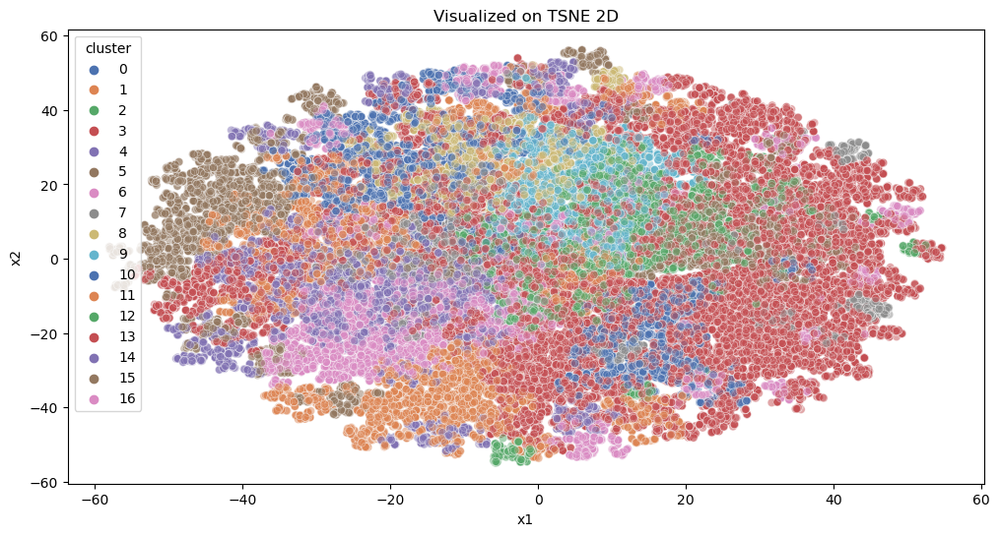

In [128]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.scatterplot(data=dftsne,x='x1',y='x2',hue='cluster',legend="full",alpha=0.5,ax=ax, palette="deep")
ax.set_title('Visualized on TSNE 2D')
import plotly.graph_objects as go
import plotly
from itertools import cycle
colors = cycle(plotly.colors.sequential.Blackbody)


fig = px.scatter_3d(
     dftsne, x='x1',y='x2',z='x3',
     color=dftsne['cluster'], labels={'color': 'cluster #'},
     color_discrete_sequence = next(colors)
    
 )
fig.update_traces(marker_size=8)
fig.show()

In [146]:
# umap_2d = UMAP(n_components=2, init='random', random_state=0)
# umap_3d = UMAP(n_components=3, init='random', random_state=0)

# proj_2d = umap_2d.fit_transform(famdX)
# dft_proj_2d = pd.DataFrame(proj_2d)
# dft_proj_2d['cluster'] = kmeans_final.labels_
# dft_proj_2d.columns = ['x1','x2','cluster']
# #proj_2d['cluster'] = kmeans_final.labels_
# proj_3d = umap_3d.fit_transform(famdX)
# dft_proj_3d = pd.DataFrame(proj_3d)
# dft_proj_3d['cluster'] = kmeans_final.labels_
# dft_proj_3d.columns = ['x1','x2','x3','cluster']


In [147]:
# proj_2d

In [148]:
# fig_2d = px.scatter(
#     dft_proj_2d, x='x1',y='x2',
#     color=dft_proj_2d['cluster'], labels={'color': 'cluster #'}
# )
# fig_3d = px.scatter_3d(
#     dft_proj_3d, x='x1',y='x2',z='x3',
#     color=dft_proj_3d['cluster'], labels={'color': 'cluster #'}
# )
# fig_3d.update_traces(marker_size=5)

# fig_2d.show()
# fig_3d.show()

In [149]:
# try:
#     import kmodes
#     print ("Imported module: kmodes\n") 
# except ImportError:
#     print ("Trying to Install required module: kmodes\n")
#     os.system('python -m pip install kmodes')

In [150]:
#from sklearn.cluster import KMeans
#from kmodes.kprototypes import KPrototypes
# SNS: Commented out the above two statements as well as the previous cell contents based on AJ's feedback


# from lightgbm import LGBMClassifier
# import shap
# from sklearn.model_selection import cross_val_score
# lgbm_data = usaccidents_final.copy()
# for c in lgbm_data.select_dtypes(include='object'):
#     lgbm_data[c] = lgbm_data[c].astype('category')

#KMeans clusters
#clf_km = LGBMClassifier(colsample_bytree=0.8)
#cv_scores_km = cross_val_score(clf_km, lgbm_data, kmeans_final.labels_, scoring='f1_weighted')
#print(f'CV F1 score for K-Means clusters is {np.mean(cv_scores_km)}')

#### We get a pretty good F1 Weightage Score here which validates the cluster split

In [151]:
usaccidents_final["cluster"] = kmeans_labels

In [152]:
usaccidents_final

,Temperature(F),Wind_Speed(mph),Pressure(in),Humidity(%),Distance(mi),Sunrise_Sunset,Stop,Traffic_Signal,Give_Way,Wind_Direction,Junction,Crossing,Weekday,Year,Month,Hour,cluster
0,68.0,13.0,29.79,73.0,0.022,Day,False,True,False,W,False,False,5,2022,8,13,4
1,42.0,0.0,29.77,34.0,0.046,Night,False,False,False,CALM,False,False,4,2020,12,1,3
2,90.0,12.0,30.03,55.0,0.047,Day,False,False,False,SW,False,False,4,2021,8,16,2
3,91.0,7.0,29.34,39.0,0.038,Day,False,False,False,VAR,False,False,2,2022,10,13,4
5,83.0,14.0,29.89,58.0,0.294,Day,False,False,False,WSW,False,False,0,2020,11,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127654,71.0,10.0,29.28,59.0,0.000,Day,False,False,False,NE,False,False,2,2021,4,16,11
127655,65.0,0.0,29.99,84.0,0.469,Night,False,False,False,CALM,False,False,6,2020,11,0,3
127656,69.0,3.0,29.89,49.0,0.614,Night,False,False,False,NE,False,False,3,2020,10,2,3
127657,63.0,10.0,29.79,37.0,1.343,Day,False,False,False,SW,False,False,2,2022,2,12,2


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003476 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 911
[LightGBM] [Info] Number of data points in the train set: 115538, number of used features: 16
[LightGBM] [Info] Start training from score -3.284032
[LightGBM] [Info] Start training from score -3.338613
[LightGBM] [Info] Start training from score -3.376644
[LightGBM] [Info] Start training from score -1.114807
[LightGBM] [Info] Start training from score -3.060611
[LightGBM] [Info] Start training from score -3.106147
[LightGBM] [Info] Start training from score -2.879799
[LightGBM] [Info] Start training from score -3.349649
[LightGBM] [Info] Start training from score -3.275294
[LightGBM] [Info] Start training from score -2.955343
[LightGBM] [Info] Start training from score -2.950533
[LightGBM] [Info] Start training from score -2.767633

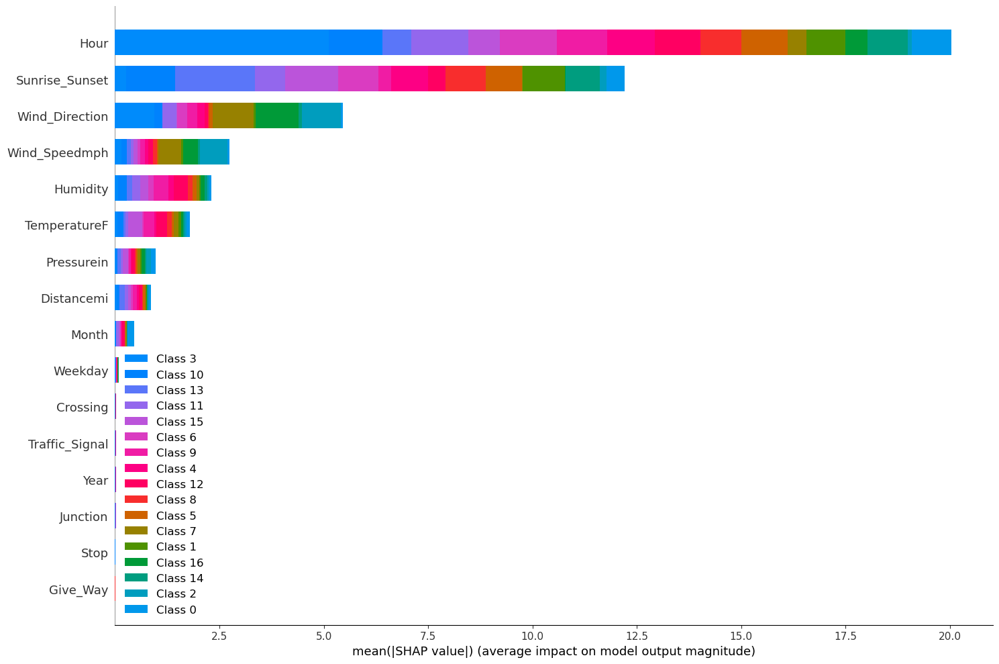

In [129]:
#Fit the model

lgbm_data = usaccidents_final.copy()
lgbm_data = lgbm_data.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
lgbm_data=lgbm_data.drop(columns=['cluster'], axis=0)
for c in lgbm_data.select_dtypes(include='object'):
        lgbm_data[c] = lgbm_data[c].astype('category')
clf_km = LGBMClassifier(colsample_bytree=0.8)
clf_km.fit(lgbm_data, kmeans_labels)

#SHAP values
explainer_km = shap.TreeExplainer(clf_km)
shap_values_km = explainer_km.shap_values(lgbm_data)
shap.summary_plot(shap_values_km, lgbm_data, plot_type="bar", plot_size=(15, 10))

### Finally we see the feature importance for each Cluster.
#### We export the data as shown below, to be fed into Tableau

In [154]:
#usaccidents.to_csv(r"Final_Clustered_Acc_Data.csv")

[clusteval] >INFO> Saving data in memory.
[clusteval] >INFO> Fit with method=[agglomerative], metric=[euclidean], linkage=[ward]
